# Dependencies

In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/magic-gamma-telescope-dataset/telescope_data.csv


In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_profiling as pp
import matplotlib.pyplot as plt
from colorama import Fore, Style
sns.set()

In [3]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Data Exploration

In [4]:
df = pd.read_csv('telescope_data.csv')

In [5]:
df.head().T

,0,1,2,3,4
Unnamed: 0,0,1,2,3,4
fLength,28.7967,31.6036,162.052,23.8172,75.1362
fWidth,16.0021,11.7235,136.031,9.5728,30.9205
fSize,2.6449,2.5185,4.0612,2.3385,3.1611
fConc,0.3918,0.5303,0.0374,0.6147,0.3168
fConc1,0.1982,0.3773,0.0187,0.3922,0.1832
fAsym,27.7004,26.2722,116.741,27.2107,-5.5277
fM3Long,22.011,23.8238,-64.858,-6.4633,28.5525
fM3Trans,-8.2027,-9.9574,-45.216,-7.1513,21.8393
fAlpha,40.092,6.3609,76.96,10.449,4.648


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19020 entries, 0 to 19019
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  19020 non-null  int64  
 1   fLength     19020 non-null  float64
 2   fWidth      19020 non-null  float64
 3   fSize       19020 non-null  float64
 4   fConc       19020 non-null  float64
 5   fConc1      19020 non-null  float64
 6   fAsym       19020 non-null  float64
 7   fM3Long     19020 non-null  float64
 8   fM3Trans    19020 non-null  float64
 9   fAlpha      19020 non-null  float64
 10  fDist       19020 non-null  float64
 11  class       19020 non-null  object 
dtypes: float64(10), int64(1), object(1)
memory usage: 1.7+ MB


In [7]:
df.profile_report(
    title='Profiling Report for the MAGIC Telescope Dataset'
).to_notebook_iframe()

/opt/conda/lib/python3.7/site-packages/IPython/core/display.py:701: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


In [8]:
x = df.drop(['class'], axis=1)
y = df['class']

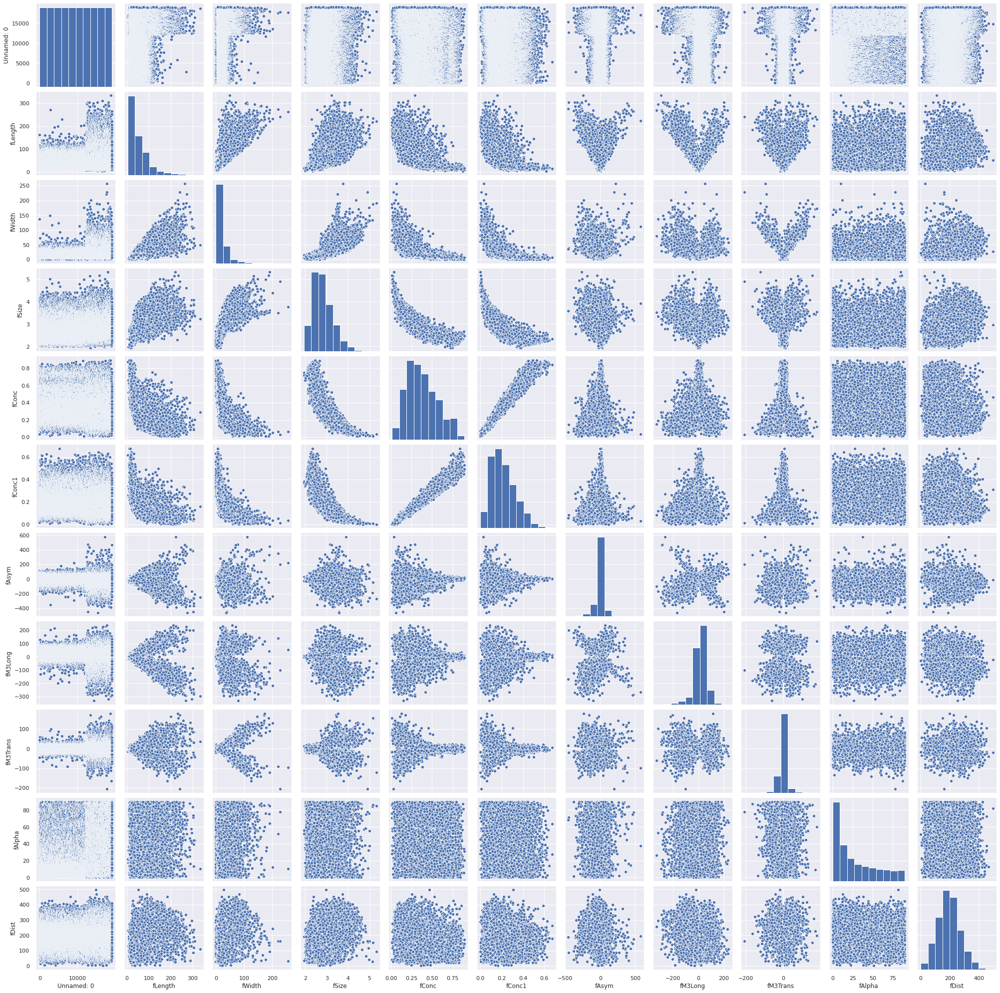

In [9]:
sns.pairplot(x)
plt.show()

In [10]:
le = LabelEncoder()
y = le.fit_transform(y)

# Train-Test Split

In [11]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=0)

# Feature Scaling

In [12]:
scaler = StandardScaler()
x_train, x_test = scaler.fit_transform(x_train), scaler.transform(x_test)

# Model Building and Evaluation

In [13]:
accuracies = {}

## Random Forest

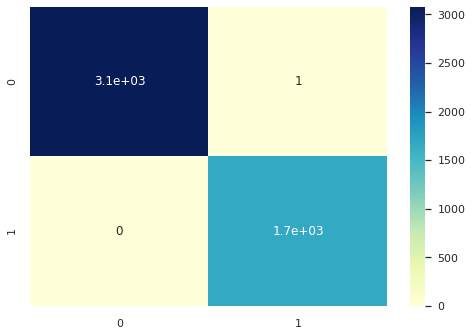

Accuracy: 99.98%

              precision    recall  f1-score   support

       gamma       1.00      1.00      1.00      3079
      hadron       1.00      1.00      1.00      1676

    accuracy                           1.00      4755
   macro avg       1.00      1.00      1.00      4755
weighted avg       1.00      1.00      1.00      4755



In [14]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(
    n_estimators=100, 
    criterion='entropy', 
    random_state=0
)
model.fit(x_train, y_train)

y_pred = model.predict(x_test)
sns.heatmap(confusion_matrix(y_test, y_pred), cmap='YlGnBu', annot=True)
plt.show()
accuracies['RandomForest'] = accuracy_score(y_test, y_pred) * 100
print(f"Accuracy: {accuracies['RandomForest']:.2f}%\n")
print(classification_report(y_test, y_pred, target_names=['gamma', 'hadron']))

## Logistic Regression

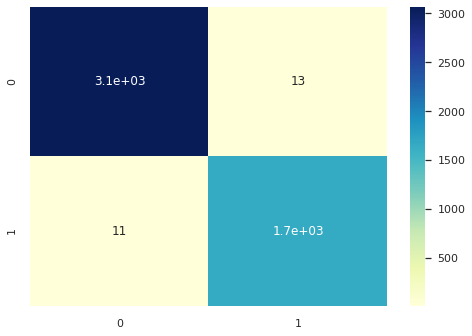

Accuracy: 99.50%

              precision    recall  f1-score   support

       gamma       1.00      1.00      1.00      3079
      hadron       0.99      0.99      0.99      1676

    accuracy                           0.99      4755
   macro avg       0.99      0.99      0.99      4755
weighted avg       0.99      0.99      0.99      4755



In [15]:
from sklearn.linear_model import SGDClassifier

model = SGDClassifier(random_state=0)
model.fit(x_train, y_train)

y_pred = model.predict(x_test)
sns.heatmap(confusion_matrix(y_test, y_pred), cmap='YlGnBu', annot=True)
plt.show()
accuracies['LogReg'] = accuracy_score(y_test, y_pred) * 100
print(f"Accuracy: {accuracies['LogReg']:.2f}%\n")
print(classification_report(y_test, y_pred, target_names=['gamma', 'hadron']))

## Support Vector Machine

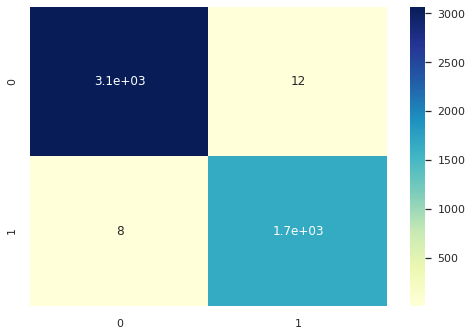

Accuracy: 99.58%

              precision    recall  f1-score   support

       gamma       1.00      1.00      1.00      3079
      hadron       0.99      1.00      0.99      1676

    accuracy                           1.00      4755
   macro avg       1.00      1.00      1.00      4755
weighted avg       1.00      1.00      1.00      4755



In [16]:
from sklearn.svm import SVC

model = SVC(C=57, random_state=0)
model.fit(x_train, y_train)

y_pred = model.predict(x_test)
sns.heatmap(confusion_matrix(y_test, y_pred), cmap='YlGnBu', annot=True)
plt.show()
accuracies['SVM'] = accuracy_score(y_test, y_pred) * 100
print(f"Accuracy: {accuracies['SVM']:.2f}%\n")
print(classification_report(y_test, y_pred, target_names=['gamma', 'hadron']))

## Decision Tree

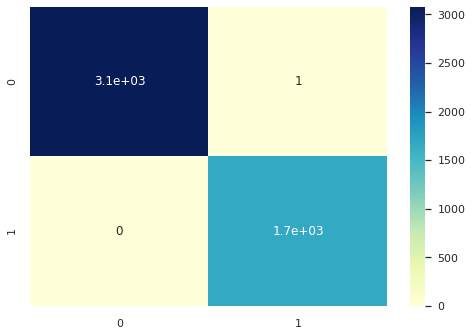

Accuracy: 99.98%

              precision    recall  f1-score   support

       gamma       1.00      1.00      1.00      3079
      hadron       1.00      1.00      1.00      1676

    accuracy                           1.00      4755
   macro avg       1.00      1.00      1.00      4755
weighted avg       1.00      1.00      1.00      4755



In [17]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(criterion='entropy', random_state=0)
model.fit(x_train, y_train)
y_pred = model.predict(x_test)
sns.heatmap(confusion_matrix(y_test, y_pred), cmap='YlGnBu', annot=True)
plt.show()
accuracies['DT'] = accuracy_score(y_test, y_pred) * 100
print(f"Accuracy: {accuracies['DT']:.2f}%\n")
print(classification_report(y_test, y_pred, target_names=['gamma', 'hadron']))

## Neural Network

In [18]:
import tensorflow as tf

model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(2, activation='sigmoid'),
])

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [19]:
x_train_nn, x_cv_nn, y_train_nn, y_cv_nn = train_test_split(x_train, y_train, test_size=0.25, random_state=0)

In [20]:
num_epochs = 6
history = model.fit(
    x_train_nn, y_train_nn, epochs=num_epochs, 
    validation_data=(x_cv_nn, y_cv_nn),
    steps_per_epoch=x_train.shape[0] // num_epochs,
    callbacks=[
        tf.keras.callbacks.ReduceLROnPlateau(patience=2, verbose=2)
    ]
)

Epoch 1/6
2377/2377 [==============================] - 6s 3ms/step - loss: 0.0594 - accuracy: 0.9786 - val_loss: 0.0321 - val_accuracy: 0.9896
Epoch 2/6
2377/2377 [==============================] - 5s 2ms/step - loss: 0.0351 - accuracy: 0.9873 - val_loss: 0.0215 - val_accuracy: 0.9916
Epoch 3/6
2377/2377 [==============================] - 5s 2ms/step - loss: 0.0280 - accuracy: 0.9900 - val_loss: 0.0188 - val_accuracy: 0.9950
Epoch 4/6
2377/2377 [==============================] - 5s 2ms/step - loss: 0.0311 - accuracy: 0.9912 - val_loss: 0.0394 - val_accuracy: 0.9907
Epoch 5/6
2377/2377 [==============================] - 6s 2ms/step - loss: 0.0242 - accuracy: 0.9917 - val_loss: 0.0139 - val_accuracy: 0.9955
Epoch 6/6
 955/2377 [===========>..................] - 3s 3ms/step - loss: 0.0311 - accuracy: 0.9918 - val_loss: 0.0349 - val_accuracy: 0.9905


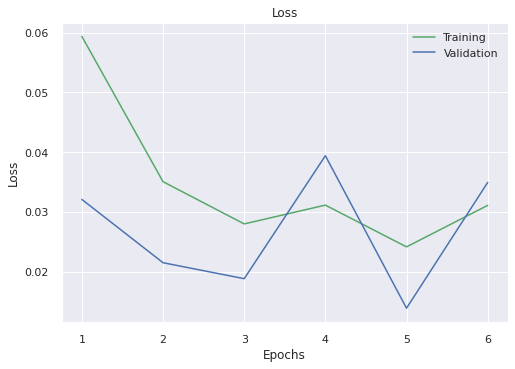

In [21]:
loss_train = history.history['loss']
loss_validation = history.history['val_loss']
epochs = range(1, num_epochs + 1)
plt.plot(epochs, loss_train, 'g', label='Training')
plt.plot(epochs, loss_validation, 'b', label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss')
plt.legend()
plt.show()

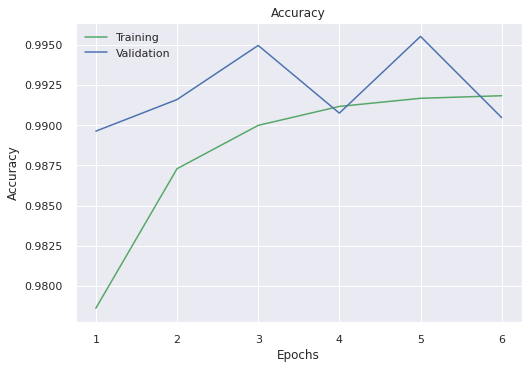

In [22]:
acc_train = history.history['accuracy']
acc_validation = history.history['val_accuracy']
epochs = range(1, num_epochs + 1)
plt.plot(epochs, acc_train, 'g', label='Training')
plt.plot(epochs, acc_validation, 'b', label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy')
plt.legend()
plt.show()

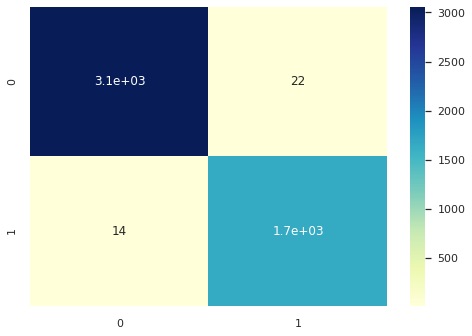

Accuracy: 99.24%

              precision    recall  f1-score   support

       gamma       1.00      0.99      0.99      3079
      hadron       0.99      0.99      0.99      1676

    accuracy                           0.99      4755
   macro avg       0.99      0.99      0.99      4755
weighted avg       0.99      0.99      0.99      4755



In [23]:
y_pred = model.predict(x_test)
y_pred = [np.argmax(y) for y in y_pred]
sns.heatmap(confusion_matrix(y_test, y_pred), cmap='YlGnBu', annot=True)
plt.show()
accuracies['NN'] = accuracy_score(y_test, y_pred) * 100
print(f"Accuracy: {accuracies['NN']:.2f}%\n")
print(classification_report(y_test, y_pred, target_names=['gamma', 'hadron']))

# Results

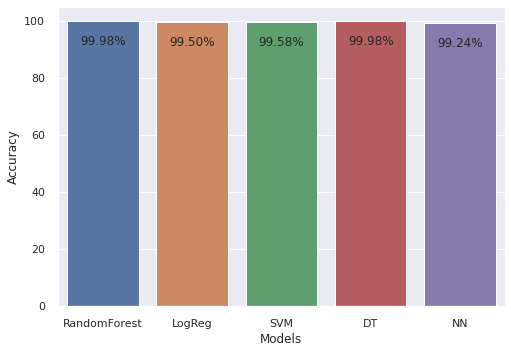

In [24]:
ax = sns.barplot(list(accuracies.keys()), list(accuracies.values()))
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():2.2f}%', 
        (p.get_x() + p.get_width() / 2., p.get_height()), 
        ha = 'center', va = 'center', 
        xytext = (0, -20), textcoords = 'offset points'
    )
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.show()

# Conclusion

Tree-based Classification Models tend to perform better on the dataset.